In [1]:
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from skimage.metrics import structural_similarity as ssim
from sklearn import preprocessing
from keras.utils import to_categorical
from keras import regularizers
from keras.models import Model
from keras.callbacks import ModelCheckpoint
from keras.layers import Input, Dense, Dropout, Lambda, GlobalAveragePooling2D
from keras.src.legacy.preprocessing.image import ImageDataGenerator

import random
import re
import glob
from tqdm import tqdm
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import time
import gc

2025-03-21 18:16:18.575039: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-21 18:16:18.591984: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-21 18:16:18.596494: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-21 18:16:18.608391: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
policy = tf.keras.mixed_precision.Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)
else:
    print("Nenhuma GPU encontrada.")

I0000 00:00:1742591792.618656   16526 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:10:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1742591793.517962   16526 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:10:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1742591793.518073   16526 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:10:00.0/numa_node
Your kernel may have been built without NUMA support.


In [3]:
# nome = 'PACS'
nome = 'Yildirim'
#nome = 'Todos'

imgs_path = 'Bases/Dataset' + nome

TEST_SIZE = 0.1
VALIDATION_SIZE = 0.1

SIMILARITY = 0.75

EPOCHS = 100
BATCH_SIZE = 32

HIGH_FREQ_THRESHOLD = 12

In [4]:
def get_next_filename(output_folder, base_name, type):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
        
    image_index = 0
    
    while True:
        output_filename = f"{base_name}_{image_index}.{type}"
        output_path = os.path.join(output_folder, output_filename)
        
        if not os.path.exists(output_path):
            return output_filename
            
        image_index += 1

In [5]:
def extract_number(filename):
    match = re.search(r'(\d+)', filename)
    return int(match.group(0)) if match else 0

In [6]:
def sort_files_numerically(file_paths):
    return sorted(file_paths, key=lambda x: extract_number(x))

In [7]:
def find_groups(images, image_paths, test_size, similarity_threshold):
    def are_similar(img1, img2, threshold):
        similarity = ssim(img1, img2)
        return similarity >= threshold

    groups = []
    current_group = [image_paths[0]]

    for i in range(1, len(images)):
        if are_similar(images[i-1], images[i], similarity_threshold):
            current_group.append(image_paths[i])
        else:
            groups.append(current_group)
            current_group = [image_paths[i]]
    
    if current_group:
        groups.append(current_group)

    all_images = [img_path for group in groups for img_path in group]

    for img_path in image_paths:
        if img_path not in all_images:
            groups.append([img_path])

    random.shuffle(groups)

    train_set = []
    test_set = []
    current_test_size = 0
    
    for i, group in enumerate(groups):
        if current_test_size + len(group) <= test_size:
            test_set.extend(group)
            current_test_size += len(group)
        else:
            train_set.extend(group)

    return train_set, test_set

In [8]:
output_folder = 'Groups'
type = 'txt'

def save_groups(train_groups, test_groups, base_name):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    output_filename = get_next_filename(output_folder, base_name, type)
    output_path = os.path.join(output_folder, output_filename)

    with open(output_path, 'w') as file:
        file.write('- test:\n')
        for idx, group in enumerate(test_groups, start=1):
            for img in group:
                file.write(f"{img}\n")
        
        file.write('- train:\n')
        for idx, group in enumerate(train_groups, start=1):
            for img in group:
                file.write(f'{img}\n')
    
    print(f'Group information saved in {output_path}')

In [9]:
def read_dataset(path, jpg, png):
    print(f'Reading dataset...\n')
    
    img_type = []
    images = []
    image_paths = []

    if jpg:
        img_type.append('*.jpg')
    if png:
        img_type.append('*.png')

# Normal

    normal_path = os.path.join(path, 'Train', 'Normal')
    print(f'Reading Normal images from: {normal_path}')
    
    for img_type_pattern in img_type:
        img_paths = glob.glob(os.path.join(normal_path, img_type_pattern))
        img_paths = sort_files_numerically(img_paths)
        
        for img_path in img_paths:
            img = cv2.imread(img_path, 0)
            img = cv2.resize(img, (224, 224))
            images.append(img)
            image_paths.append(img_path)

# Kidney

    kidney_stone_path = os.path.join(path, 'Train', 'Kidney_stone')
    print(f'Reading Kidney_stone images from: {kidney_stone_path}')
    
    for img_type_pattern in img_type:
        img_paths = glob.glob(os.path.join(kidney_stone_path, img_type_pattern))
        img_paths = sort_files_numerically(img_paths)
        
        for img_path in img_paths:
            img = cv2.imread(img_path, 0)
            img = cv2.resize(img, (224, 224))
            images.append(img)
            image_paths.append(img_path)

# ...
    
    images = np.array(images)
    image_paths = np.array(image_paths)

    return images, image_paths

In [10]:
all_X, all_image_paths = read_dataset(path=imgs_path, jpg=True, png=True)

Reading dataset...

Reading Normal images from: Bases/DatasetYildirim/Train/Normal
Reading Kidney_stone images from: Bases/DatasetYildirim/Train/Kidney_stone


In [11]:
def freq_spec(image, threshold, add_noise):
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)

    if add_noise:
        amplification_factor = 0.5
        
        rows, cols = image.shape
        crow, ccol = rows//2, cols//2

        mask = np.zeros((rows, cols), dtype=bool)
        mask[crow-threshold:crow+threshold, ccol-threshold:ccol+threshold] = True
        high_freq_mask = ~mask

        fshift[high_freq_mask] *= amplification_factor

    magnitude_spectrum_high = 20 * np.log(np.abs(fshift) + 1)

    return magnitude_spectrum_high

In [12]:
def save_specs(images, threshold, add_noise):
    specs = []
    for img in images:
        specs.append(freq_spec(img, threshold, add_noise))
    return specs

In [13]:
# Processar todas as imagens e criar labels
all_specs = []
all_labels = []

# Processar metade normal e metade hackeada
half = len(all_X) // 2
for i, img in enumerate(all_X):
    if i < half:
        all_specs.append(freq_spec(img, 100 - HIGH_FREQ_THRESHOLD, add_noise=False))
        all_labels.append(0)
    else:
        all_specs.append(freq_spec(img, 100 - HIGH_FREQ_THRESHOLD, add_noise=True))
        all_labels.append(1)

all_specs = np.array(all_specs)
all_labels = np.array(all_labels)

In [14]:
#len_normal_specs = int(len(all_X) / 2)

In [15]:
#normal_specs = all_X[0:len_normal_specs]

In [16]:
#normal_specs = save_specs(normal_specs, 100 - HIGH_FREQ_THRESHOLD, add_noise = False)

In [17]:
#print(len(normal_specs))

In [18]:
#hacked_specs = all_X[len_normal_specs:len(all_X)]

In [19]:
#hacked_specs = save_specs(hacked_specs, 100 - HIGH_FREQ_THRESHOLD, add_noise = True)

In [20]:
#print(len(hacked_specs))

In [21]:
print("Quantidade das imagens:", all_specs.shape)
print("Exemplo dos labels (False = original, True = com ruído):", all_labels)

Quantidade das imagens: (1799, 224, 224)
Exemplo dos labels (False = original, True = com ruído): [0 0 0 ... 1 1 1]


In [22]:
X_train, X_test, y_train, y_test, paths_train, paths_test = train_test_split(
        all_specs, all_labels, all_image_paths,
        test_size=TEST_SIZE, 
        stratify=all_labels,
#       random_state=53
    )

In [23]:
def plot_specs(specs, title):
    total_images = len(specs)
    imgs_per_figure = 100
    cols = 5
    rows = (imgs_per_figure + cols - 1) // cols

    for start in range(0, total_images, imgs_per_figure):
        plt.figure(figsize=(cols * 3, rows * 3))
        end = min(start + imgs_per_figure, total_images)
        
        for i in range(start, end):
            plt.subplot(rows, cols, i - start + 1)
            plt.imshow(specs[i], cmap='gray')
            plt.title(f"{title} - freq spec: img {i+1}")
            plt.axis('off')
            
        plt.tight_layout()
        plt.show()

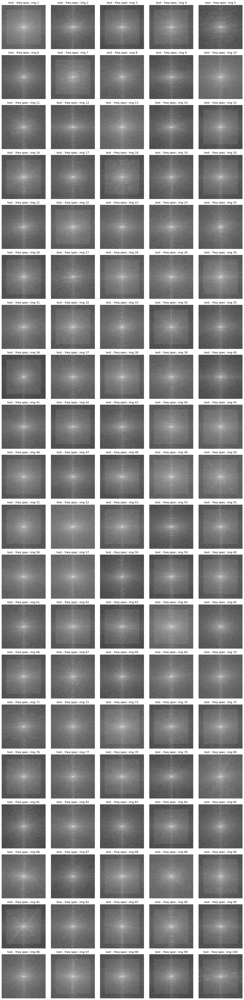

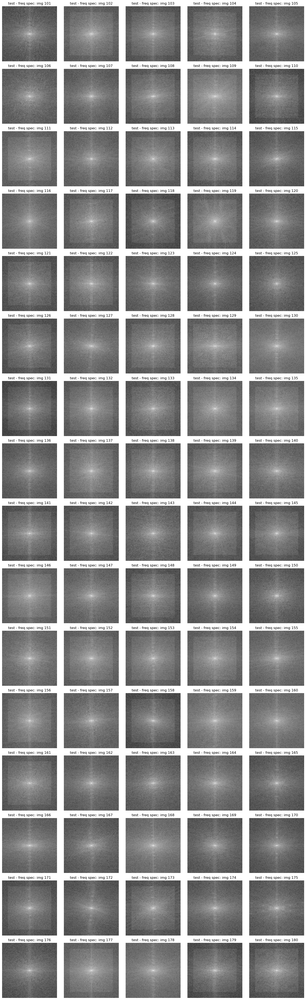

In [24]:
# Plotar todos os espectros de teste
plot_specs(X_test, title="test")

In [25]:
pausa de teste

SyntaxError: invalid syntax (1732705172.py, line 1)

In [ ]:
# Defines the model layers (now for ResNet50)
def model_mobilenetv2():
    inputs = Input(shape=(224, 224, 1))
    
    # 1. Conversão para 3 canais (igual ao anterior)
    x = Lambda(lambda x: tf.repeat(x, 3, axis=-1))(inputs)
    
    # 2. Pré-processamento específico do MobileNetV2
    x = tf.keras.applications.mobilenet_v2.preprocess_input(x)
    
    # 3. Carregar MobileNetV2
    base_model = tf.keras.applications.MobileNetV2(
        weights='imagenet',
        include_top=False,
        input_tensor=x,
        alpha=1.0  # Controla a largura da rede (1.0 = 224x224)
    )
    
    # 4. Topo personalizado (ajustar camadas se necessário)
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    
    # Reduzir unidades para melhor compatibilidade
    x = Dense(128, kernel_regularizer=regularizers.l2(0.01), activation='relu')(x)
    x = Dropout(0.3)(x)
    
    x = Dense(64, kernel_regularizer=regularizers.l2(0.01), activation='relu')(x)
    x = Dropout(0.3)(x)
    
    outputs = Dense(2, activation='softmax')(x)
    
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    
    return model

In [ ]:
# Configurar K-Fold
kfold = StratifiedKFold(n_splits=5, shuffle=True)
#kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=53)
fold_no = 1
histories = []
metrics = []

for train_idx, val_idx in kfold.split(X_train, y_train):
    print(f'\nTraining Fold {fold_no}/5')
    
# Split dos dados
    X_train_fold = X_train[train_idx]
    y_train_fold = y_train[train_idx]
    X_val_fold = X_train[val_idx]
    y_val_fold = y_train[val_idx]
    
# Pré-processamento final
    X_train_fold = np.expand_dims(X_train_fold, axis=-1)
    X_val_fold = np.expand_dims(X_val_fold, axis=-1)
    y_train_fold_cat = to_categorical(y_train_fold, 2)
    y_val_fold_cat = to_categorical(y_val_fold, 2)

# Criar novo modelo para cada fold
    model = model_mobilenetv2()

# Checkpoint com nome do fold
    output_folder = 'Models_saves'
    base_name = 'model_' + nome
    type = 'keras'
    model_filepath = os.path.join(output_folder, get_next_filename(output_folder, base_name, type))
    
    checkpoint = ModelCheckpoint(
        f'model_{nome}_fold_{fold_no}.keras',
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1,
        mode='max'
    )

# Calcula tempo
    start_time = time.time()
    
# Treinar modelo
    history = model.fit(
        X_train_fold, y_train_fold_cat,
        batch_size=BATCH_SIZE,
        epochs=EPOCHS,
        validation_data=(X_val_fold, y_val_fold_cat),
        callbacks=[checkpoint],
        verbose=1
    )

# Calcula tempo
    end_time = time.time()

    training_time = end_time - start_time
    print(f"\nO modelo demorou {training_time:.2f} segundos para treinar.")
    
# Coletar métricas
    histories.append(history)
    predictions = model.predict(X_val_fold)
    y_pred = np.argmax(predictions, axis=1)
    metrics.append({
        'fold': fold_no,
        'report': classification_report(y_val_fold, y_pred, output_dict=True, zero_division=0),
        'matrix': confusion_matrix(y_val_fold, y_pred)
    })
    
    fold_no += 1

    del model  # Liberar memória do modelo
    tf.keras.backend.clear_session()  # Limpar sessão do TensorFlow
    gc.collect()  # Forçar coleta de lixo

In [ ]:
print('\n\nCross-Validation Results:')
for metric in metrics:
    print(f'\nFold {metric["fold"]}:')
    print(classification_report(y_val_fold, y_pred, target_names=cm_plot_labels))

# Treinar modelo final com todos os dados de treino
final_model = model_resnet50()
final_model.fit(
    np.expand_dims(all_train_specs, axis=-1),
    to_categorical(all_train_labels, 2),
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    verbose=1
)

# Avaliar no teste final
test_loss, test_acc = final_model.evaluate(
    np.expand_dims(X_test, axis=-1),
    to_categorical(y_test, 2),
    verbose=0
)
print(f'\nFinal Test Accuracy: {test_acc:.4f}')

# Gerar gráficos finais (substituir)
y_pred_test = np.argmax(final_model.predict(np.expand_dims(X_test, axis=-1)), axis=1)
plot_and_save_report(y_test, y_pred_test)
plot_and_matrix(y_test, y_pred_test, cm_plot_labels)

cm_plot_labels = ['Normal', 'Hacked']

In [ ]:
# GC collect
tf.keras.backend.clear_session()
gc.collect()